### Проект по предсказанию цены на недвижимость

__Задание:__

Используя данные из `train.csv`, построить модель для предсказания цен на недвижимость (квартиры).   
С помощью полученной модели предсказать цены для квартир из файла `test.csv`.

__Целевая переменная:__

`Price`

__Метрика:__

R2 - коэффициент детерминации (`sklearn.metrics.r2_score`)

__Сроки и условия сдачи:__

* Для успешной сдачи должны быть все предсказания (для 5000 квартир) и R2 должен быть больше 0.6.

__Примечание:__ 

Все файлы csv должны содержать названия полей (header - то есть "шапку"),
разделитель - запятая. В файлах не должны содержаться индексы из датафрейма.

Рекомендации для файла с кодом (ipynb):
1. Файл должен содержать заголовки и комментарии
2. Повторяющиеся операции лучше оформлять в виде функций
3. Не делать вывод большого количества строк таблиц (5-10 достаточно)
4. По возможности добавлять графики, описывающие данные (около 3-5)
5. Добавлять только лучшую модель, то есть не включать в код все варианты решения проекта
6. Скрипт проекта должен отрабатывать от начала и до конца (от загрузки данных до выгрузки предсказаний)
7. Весь проект должен быть в одном скрипте (файл ipynb).
8. При использовании статистик (среднее, медиана и т.д.) в качестве признаков, лучше считать их на трейне, и потом на валидационных и тестовых данных не считать статистики заново, а брать их с трейна. Если хватает знаний, можно использовать кросс-валидацию, но для сдачи этого проекта достаточно разбить данные из train.csv на train и valid.
9. Проект должен полностью отрабатывать за разумное время (не больше 10 минут), поэтому в финальный вариант лучше не включать GridSearch с перебором большого количества сочетаний параметров.

**Для чего нужно?**

*В банках, страховых компаниях:*

* Узнать истинную стоимость имущества (залога)
* Принять решение о выдаче ипотеки/страховки
* Принять решение о % по ипотеке/страховке

*На площадках объявлений (Авито, Циан, ...):*

* Найти недооцененные квартиры (~ выгодные предложения), показать их пользователям
* Показывать рыночную стоимость квартиры пользователям
* Для тех, кто продает квартиру, рекомендовать цену продажи

*Для инвесторов в недвижимость:*

* Определять рыночную стоимость квартир
* Поиск недооцененных активов
* Торговля на рынке недвижимости

### Подключение библиотек и загрузка данных

In [1]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from pylab import rcParams
import pickle
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, \
                             StackingRegressor, BaggingRegressor, VotingRegressor
from sklearn.metrics import r2_score as r2
from sklearn.model_selection import KFold, GridSearchCV, StratifiedKFold

%matplotlib inline
%config InlineBackend.figure_format = 'svg'
# rcParams['figure.figsize'] = 10, 8
import warnings
warnings.filterwarnings('ignore')

pd.options.display.max_columns = 100

In [2]:
TRAIN_DATASET_PATH='train.csv'
TEST_DATASET_PATH='test.csv'
PREPARED_TRAIN_DATASET_PATH='train_prepared.csv'
PREPARED_VALID_DATASET_PATH='valid_prepared.csv'
PREPARED_TEST_DATASET_PATH='test_prepared.csv'

In [3]:
def evaluate_preds(train_true_values, train_pred_values, test_true_values, test_pred_values):

    print("Train R2:\t" + str(round(r2(train_true_values, train_pred_values), 3)))
    print("Test R2:\t" + str(round(r2(test_true_values, test_pred_values), 3)))
    
    plt.figure(figsize=(10,6))
    
    plt.subplot(121)
    sns.scatterplot(x=train_pred_values, y=train_true_values)
    plt.xlabel('Predicted values')
    plt.ylabel('True values')
    plt.title('Train sample prediction')
    
    plt.subplot(122)
    sns.scatterplot(x=test_pred_values, y=test_true_values)
    plt.xlabel('Predicted values')
    plt.ylabel('True values')
    plt.title('Test sample prediction')

    plt.show()

In [4]:
def get_tsne_plot(tsne_data, labels=None):
    '''
    get tsne data, cluster labels
    return vizualization of clusterization
    '''
    plt.figure(figsize=(9, 6))
    plt.scatter(tsne_data[:, 0], tsne_data[:, 1], c=labels)
    plt.show()

In [5]:
df_train = pd.read_csv(TRAIN_DATASET_PATH)
df_test = pd.read_csv(TEST_DATASET_PATH)

## Описание датасета

* Id - идентификационный номер квартиры
* DistrictId - идентификационный номер района
* Rooms - количество комнат
* Square - площадь
* LifeSquare - жилая площадь
* KitchenSquare - площадь кухни
* Floor - этаж
* HouseFloor - количество этажей в доме
* HouseYear - год постройки дома
* Ecology_1, Ecology_2, Ecology_3 - экологические показатели местности
* Social_1, Social_2, Social_3 - социальные показатели местности
* Healthcare_1, Helthcare_2 - показатели местности, связанные с охраной здоровья
* Shops_1, Shops_2 - показатели, связанные с наличием магазинов, торговых центров
* Price - цена квартиры

In [6]:
df_train.describe()

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Price
count,10000.00000,10000.000000,10000.000000,10000.000000,7887.000000,10000.000000,10000.000000,10000.000000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,5202.000000,10000.000000,10000.000000,10000.000000
mean,8383.40770,50.400800,1.890500,56.315775,37.199645,6.273300,8.526700,12.609400,3.990166e+03,0.118858,24.687000,5352.157400,8.039200,1142.904460,1.319500,4.231300,214138.857399
std,4859.01902,43.587592,0.839512,21.058732,86.241209,28.560917,5.241148,6.775974,2.005003e+05,0.119025,17.532614,4006.799803,23.831875,1021.517264,1.493601,4.806341,92872.293865
min,0.00000,0.000000,0.000000,1.136859,0.370619,0.000000,1.000000,0.000000,1.910000e+03,0.000000,0.000000,168.000000,0.000000,0.000000,0.000000,0.000000,59174.778028
25%,4169.50000,20.000000,1.000000,41.774881,22.769832,1.000000,4.000000,9.000000,1.974000e+03,0.017647,6.000000,1564.000000,0.000000,350.000000,0.000000,1.000000,153872.633942
50%,8394.50000,36.000000,2.000000,52.513310,32.781260,6.000000,7.000000,13.000000,1.977000e+03,0.075424,25.000000,5285.000000,2.000000,900.000000,1.000000,3.000000,192269.644879
75%,12592.50000,75.000000,2.000000,65.900625,45.128803,9.000000,12.000000,17.000000,2.001000e+03,0.195781,36.000000,7227.000000,5.000000,1548.000000,2.000000,6.000000,249135.462171
max,16798.00000,209.000000,19.000000,641.065193,7480.592129,2014.000000,42.000000,117.000000,2.005201e+07,0.521867,74.000000,19083.000000,141.000000,4849.000000,6.000000,23.000000,633233.466570


In [7]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             10000 non-null  int64  
 1   DistrictId     10000 non-null  int64  
 2   Rooms          10000 non-null  float64
 3   Square         10000 non-null  float64
 4   LifeSquare     7887 non-null   float64
 5   KitchenSquare  10000 non-null  float64
 6   Floor          10000 non-null  int64  
 7   HouseFloor     10000 non-null  float64
 8   HouseYear      10000 non-null  int64  
 9   Ecology_1      10000 non-null  float64
 10  Ecology_2      10000 non-null  object 
 11  Ecology_3      10000 non-null  object 
 12  Social_1       10000 non-null  int64  
 13  Social_2       10000 non-null  int64  
 14  Social_3       10000 non-null  int64  
 15  Healthcare_1   5202 non-null   float64
 16  Helthcare_2    10000 non-null  int64  
 17  Shops_1        10000 non-null  int64  
 18  Shops_2

* Id - id наблюдения, сделаем строкой
* DistrictID - номер района, показывает количество наблюдений по этому району (колво квартир), соответственно, популярность района. Скорее всего в районах, где больше всего наблюдений - будет больше население, соответственно, цена на квартиры там ниже
* Rooms - видно, что самые популярные - 1, 2 комнатные квартиры. 0 комнат - возможно, студия, нужно смотреть на все остальное. 19 комнат - очевидно, нетиповая квартира
* Square - здесь есть странные маленькие значения, плюс надо смотреть, чтобы суммарно площадь была не меньше, чем сумма площади кухни и жилой. Большая площадь тоже редкое явление. 
* LifeSquare - есть слишком маленькие площади и есть большие - выбросы, много нулей - их заполним алгоритмом 
* KitchenSquare - есть явные выбросы в виде больших площадей, 0 - вопрос (может быть, студия?)
* Floor - не должен быть выше, чем этажность дома
* HouseFloor - нулевая этажность - выбросы
* HouseYear - есть слишком старые дома 
* Shops - в спальных районах всегда больше магазинов, там скорее всего будет больше численность населения и больше квартир
* Healthcare - кол-во поликлиник в районе и расстояние до ближайшего пункта, есть много пропусков, заполним их средним значением по району
* Ecology - скорее всего коэффициент и классы
* Social - вероятно, рассояние до социальных объектов, можно посмотреть связь с DistrictId

### Обзор целевой переменной

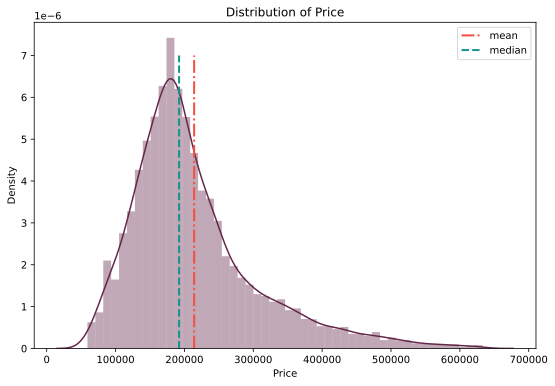

Mean price:  214138.86 
Median price:  192269.64487934904


In [8]:
price = df_train['Price']
price_mean = round(price.mean(), 2)
price_median = price.median()
price_mode = price.mode()[0]

plt.figure(figsize = (9, 6))

sns.distplot(price, color='#63264a')

y = np.linspace(0, 0.000007, 150)
plt.plot([price_mean] * 150, y, label='mean', linestyle='-.', linewidth=2, color='#F44E3F')
plt.plot([price_median] * 150, y, label='median', linestyle='--', linewidth=2, color='#129490')

plt.title('Distribution of Price')
plt.legend()
plt.show()

print('Mean price: ', price_mean, '\nMedian price: ', price_median)

Видно, что на графике распределение цен близко к нормальному, выбросов нет. Самый популярный диапазон цен - от 80000 до 280000 - скорее всего это цены на 1-2 комнатные квартиры, дешевле, возможно, студии, а дорогие встречаются реже. 

### Анализ признаков

* Square, LifeSquare, KitchenSquare

Построим графики распределения площадей. Выделим отдельный датафрейм, в котором отсортируем данные по столбцу Square. 

In [9]:
squares = df_train[['Square', 'LifeSquare', 'KitchenSquare']].sort_values('Square')
squares

,Square,LifeSquare,KitchenSquare
6392,1.136859,4.525736,1.0
8283,1.988943,2.642219,1.0
4853,2.377248,0.873147,0.0
1608,2.596351,4.604943,1.0
9294,2.954309,5.257278,1.0
...,...,...,...
1981,212.932361,211.231125,0.0
1982,275.645284,233.949309,26.0
4690,409.425181,410.639749,10.0
4262,604.705972,NaN,1.0


По таблице видно, что значения площадей меняются от ~1 до 641, при этом, в целом, суммарные значения жилой площади и площади кухни примерно совпадают со значениями площади. Если есть у Life Square значения, выходящие за пределы площади и неадекватные площади кухни - При обработке попробуем их заменить на что-то более адекватное

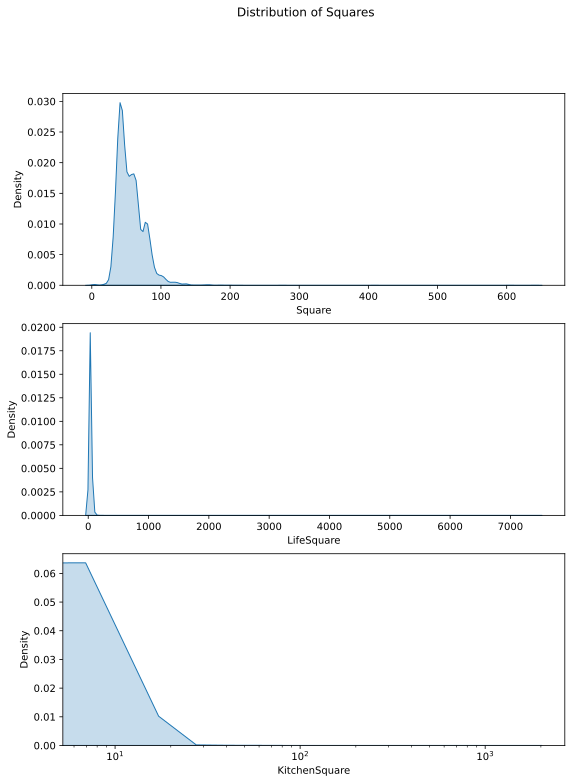

In [10]:
plt.figure(figsize = (9, 12))

plt.subplot(311)
sns.kdeplot(squares['Square'], shade=True, legend=False)
plt.xlabel('Square')

plt.subplot(312)
sns.kdeplot(squares['LifeSquare'], shade=True, legend=False)
plt.xlabel('LifeSquare')

plt.subplot(313)
sns.kdeplot(squares['KitchenSquare'], shade=True, legend=False)
plt.xscale('log')
plt.xlabel('KitchenSquare')

plt.suptitle('Distribution of Squares')
plt.show()

Видно, что у каждой из площадей есть слишком низкие и высокие значения:   
У Square - меньше 20 и больше 200  
У LifeSquare - больше 200  
У KitchenSquare - примерно больше 60 (?)  

Посмотрим на значения в разрезе целевой переменной

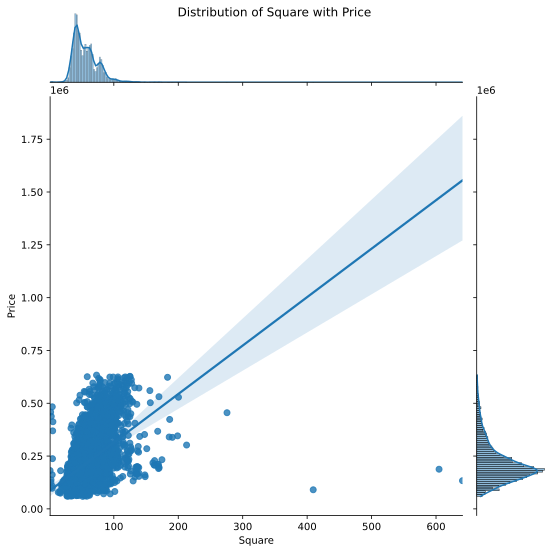

In [11]:
grid = sns.jointplot(df_train['Square'], df_train['Price'], kind='reg')
grid.fig.set_figwidth(8)
grid.fig.set_figheight(8)
plt.suptitle('Distribution of Square with Price')
plt.show()

In [12]:
df_train.loc[(df_train['Square'] > 200) | (df_train['Square'] < 15)].sort_values('Square')

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
6392,14786,1,1.0,1.136859,4.525736,1.0,3,1.0,1977,0.007122,B,B,1,264,0,NaN,0,1,B,181434.825589
8283,15744,34,1.0,1.988943,2.642219,1.0,21,4.0,1977,0.069753,B,B,53,13670,4,NaN,1,11,B,458378.777006
4853,3224,27,0.0,2.377248,0.873147,0.0,1,0.0,1977,0.017647,B,B,2,469,0,NaN,0,0,B,126596.941798
1608,10202,6,1.0,2.596351,4.604943,1.0,3,25.0,2014,0.243205,B,B,5,1564,0,540.0,0,0,B,137597.601458
9294,6782,45,1.0,2.954309,5.257278,1.0,3,1.0,1977,0.195781,B,B,23,5212,6,NaN,3,2,B,438005.182323
3280,10527,27,1.0,4.380726,40.805837,1.0,10,17.0,2013,0.211401,B,B,9,1892,0,NaN,0,1,B,97560.720383
4900,4504,27,3.0,4.390331,5.610772,1.0,8,19.0,2016,0.211401,B,B,9,1892,0,NaN,0,1,B,161379.067034
9613,7657,38,1.0,4.502784,4.618547,1.0,28,1.0,1977,0.060753,B,B,15,2787,2,520.0,0,7,B,483283.488083
1316,11526,27,1.0,4.633498,1.969969,1.0,18,1.0,1977,0.011654,B,B,4,915,0,NaN,0,0,B,107604.269441
8030,13265,1,3.0,4.823679,79.767964,0.0,6,17.0,1977,0.007122,B,B,1,264,0,NaN,0,1,B,237716.681261


Выбросами будем считать площадь больше 400 и меньше 10

In [13]:
grid = sns.jointplot(df_train['LifeSquare'], df_train['Price'], kind='reg')
grid.fig.set_figwidth(8)
grid.fig.set_figheight(8)
plt.suptitle('Distribution of LifeSquare with Price')
plt.show()

In [14]:
df_train.loc[df_train['LifeSquare'] > 250].sort_values('LifeSquare')
# df_test.loc[df_test['LifeSquare'] > 250].sort_values('LifeSquare')

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
590,14990,23,2.0,48.449873,263.542020,5.0,6,5.0,1972,0.075779,B,B,6,1437,3,NaN,0,2,B,141780.231857
4690,2307,102,1.0,409.425181,410.639749,10.0,4,4.0,2016,0.238617,B,B,26,3889,6,705.0,3,6,B,90470.430830
8437,15886,85,3.0,78.059331,461.463614,10.0,12,16.0,1998,0.037178,B,B,52,11217,1,2300.0,1,7,B,394253.299978
6977,11602,30,2.0,641.065193,638.163193,10.0,20,19.0,2019,0.000078,B,B,22,6398,141,1046.0,3,23,B,133529.681562
4328,16550,27,3.0,81.694417,7480.592129,1.0,9,17.0,2016,0.017647,B,B,2,469,0,NaN,0,0,B,217357.492366


Выбросами будем считать все значения меньше 10 больше 250, и те , которые больше общей площади заменим их на разницу между Square KitchenSquare

In [15]:
grid = sns.jointplot(df_train['KitchenSquare'], df_train['Price'], kind='reg')
grid.fig.set_figwidth(8)
grid.fig.set_figheight(8)
plt.suptitle('Distribution of KitchenSquare with Price')
plt.show()

In [16]:
df_train.loc[(df_train['KitchenSquare'] > 50) | (df_train['KitchenSquare'] == 0)].sort_values('KitchenSquare')

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
2,4765,53,2.0,44.947953,29.197612,0.0,8,12.0,1968,0.049637,B,B,34,7759,0,229.0,1,3,B,220925.908524
6589,9731,1,2.0,52.192543,NaN,0.0,7,17.0,1977,0.007122,B,B,1,264,0,NaN,0,1,B,200573.760515
6599,9162,52,1.0,43.963230,NaN,0.0,10,17.0,1977,0.371149,B,B,34,7065,1,750.0,2,5,B,134376.081358
6607,657,6,2.0,68.556375,NaN,0.0,14,17.0,1977,0.243205,B,B,5,1564,0,540.0,0,0,B,190216.681029
6609,13491,0,1.0,38.178277,0.370619,0.0,19,17.0,2016,0.006076,B,B,30,5285,0,645.0,6,6,B,105134.286994
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4651,12552,58,3.0,116.405693,113.109653,112.0,3,3.0,2016,0.437885,B,B,23,5735,3,1084.0,0,5,B,296165.936689
2969,7441,62,3.0,114.734473,112.589083,112.0,3,3.0,2015,0.072158,B,B,2,629,1,NaN,0,0,A,315245.521059
9895,2737,27,3.0,123.430072,125.806981,123.0,5,10.0,2015,0.017647,B,B,2,469,0,NaN,0,0,B,234194.837047
8584,14679,81,1.0,32.276663,19.278394,1970.0,6,1.0,1977,0.006076,B,B,30,5285,0,645.0,6,6,B,105539.556275


In [17]:
df_train.loc[(df_train['KitchenSquare'] > 40)].sort_values('KitchenSquare')

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price
4588,448,48,1.0,41.186904,1.626502,41.0,2,1.0,1977,0.041125,B,B,46,9515,5,NaN,1,10,B,216882.265408
4142,15466,88,1.0,42.357487,44.779714,41.0,10,19.0,2016,0.127376,B,B,43,8429,3,NaN,3,9,B,194525.103119
3431,7111,27,2.0,139.070296,89.787666,42.0,5,3.0,2016,0.014073,B,B,2,475,0,NaN,0,0,B,153946.777452
7480,10546,62,1.0,46.013187,43.417043,43.0,4,17.0,2019,0.072158,B,B,2,629,1,NaN,0,0,A,113909.099428
1867,3267,58,3.0,138.980817,138.004600,43.0,2,2.0,1977,0.437885,B,B,23,5735,3,1084.0,0,5,B,169528.896664
551,1315,6,1.0,48.128114,45.023531,48.0,21,1.0,2013,0.243205,B,B,5,1564,0,540.0,0,0,B,146950.912410
5904,673,27,1.0,54.418214,51.498581,51.0,10,17.0,2017,0.072158,B,B,2,629,1,NaN,0,0,A,133273.635012
9889,12918,23,2.0,51.440463,53.134243,51.0,3,17.0,2017,0.005767,B,B,1,388,0,NaN,0,0,B,88150.012510
1860,4265,161,2.0,53.216778,32.644859,53.0,7,17.0,1994,0.000699,B,B,14,3369,24,4129.0,0,3,B,261125.669724
8232,7162,34,2.0,56.738764,57.510395,54.0,26,25.0,2016,0.069753,B,B,53,13670,4,NaN,1,11,B,244220.621495


* Square, LifeSquare, KitchenSquare

Посмотрим на распределение площадей по квантилям, видно, что при значении 99,9 кривая резко растет в верх, а начиная с 0,01 начинает расти

Пробовала обрезать по квантилям меньше 0.01 и больше 99.99 - неудачно

Text(0, 0.5, 'Square')

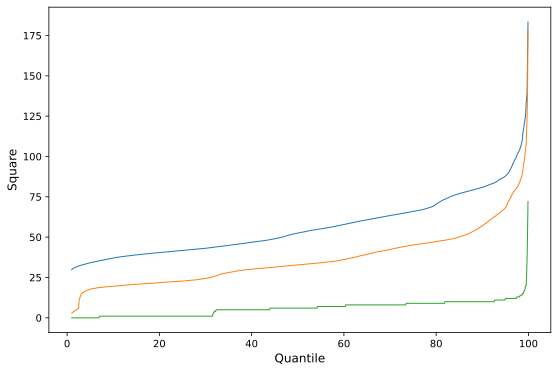

In [18]:
S = [np.percentile(df_train['Square'].dropna(), q=x) for x in np.arange(1, 100, 0.1)]
LS = [np.percentile(df_train['LifeSquare'].dropna(), q=x) for x in np.arange(1, 100, 0.1)]
KS = [np.percentile(df_train['KitchenSquare'].dropna(), q=x) for x in np.arange(1, 100, 0.1)]

plt.figure(figsize = (9, 6))
plt.plot(np.arange(1, 100, 0.1), S, linewidth=1)
plt.plot(np.arange(1, 100, 0.1), LS, linewidth=1)
plt.plot(np.arange(1, 100, 0.1), KS, linewidth=1)
plt.xlabel('Quantile', size=12)
plt.ylabel('Square', size=12)

### Предобработка данных

* `Id` - id наблюдения, сделаем строковым типом, чтобы столбец не участвовал в вычислениях

In [19]:
df_train['Id'] = df_train['Id'].astype(str)
df_test['Id'] = df_test['Id'].astype(str)

Разобьем датасет df_train на df_train и df_valid

In [20]:
df_train, df_valid = train_test_split(df_train, shuffle=True, test_size=0.3, random_state=42)

In [21]:
df_valid.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3000 entries, 6252 to 4705
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             3000 non-null   object 
 1   DistrictId     3000 non-null   int64  
 2   Rooms          3000 non-null   float64
 3   Square         3000 non-null   float64
 4   LifeSquare     2373 non-null   float64
 5   KitchenSquare  3000 non-null   float64
 6   Floor          3000 non-null   int64  
 7   HouseFloor     3000 non-null   float64
 8   HouseYear      3000 non-null   int64  
 9   Ecology_1      3000 non-null   float64
 10  Ecology_2      3000 non-null   object 
 11  Ecology_3      3000 non-null   object 
 12  Social_1       3000 non-null   int64  
 13  Social_2       3000 non-null   int64  
 14  Social_3       3000 non-null   int64  
 15  Healthcare_1   1560 non-null   float64
 16  Helthcare_2    3000 non-null   int64  
 17  Shops_1        3000 non-null   int64  
 18  Shops

* `Square` - Выбросы - больше 400 и меньше 10 - Те данные, которые >400 удалим,  <10 пока оставим, так как в тестовых данных встречаются подобные значения.
Добавим дополнительный признак для выбросов

In [22]:
df_train['OutliersSquare'] = 0
df_train['OutliersSquare'].loc[(df_train['Square'] > 400) | (df_train['Square'] < 10)] = 1

df_valid['OutliersSquare'] = 0
df_valid['OutliersSquare'].loc[(df_valid['Square'] > 400) | (df_valid['Square'] < 10)] = 1

df_test['OutliersSquare'] = 0
df_test['OutliersSquare'].loc[(df_test['Square'] > 400) | (df_test['Square'] < 10)] = 1

In [23]:
df_train = df_train.loc[df_train['Square'] < 400]

In [24]:
# df_train = df_train.loc[df_train['Square'] > 10] - не сработало

* `LifeSquare` - Выбросы - больше 250 и меньше 10 - Те данные, которые >1000 разделим на 100, те, которые >250 разделим на 10,  <10 пока оставим, так как в тестовых данных встречаются подобные значения

In [25]:
df_train['OutliersLifeSquare'] = 0
df_train['OutliersLifeSquare'].loc[(df_train['LifeSquare'] > 250) | (df_train['LifeSquare'] < 10)] = 1

df_valid['OutliersLifeSquare'] = 0
df_valid['OutliersLifeSquare'].loc[(df_valid['LifeSquare'] > 250) | (df_valid['LifeSquare'] < 10)] = 1

df_test['OutliersLifeSquare'] = 0
df_test['OutliersLifeSquare'].loc[(df_test['LifeSquare'] > 250) | (df_test['LifeSquare'] < 10)] = 1

In [26]:
df_train['LifeSquare'].loc[df_train['LifeSquare'] > 1000] = df_train['LifeSquare'] / 100
df_train['LifeSquare'].loc[df_train['LifeSquare'] > 250] = df_train['LifeSquare'] / 10

df_valid['LifeSquare'].loc[df_valid['LifeSquare'] > 1000] = df_valid['LifeSquare'] / 100
df_valid['LifeSquare'].loc[df_valid['LifeSquare'] > 250] = df_valid['LifeSquare'] / 10

df_test['LifeSquare'].loc[df_test['LifeSquare'] > 1000] = df_test['LifeSquare'] / 100
df_test['LifeSquare'].loc[df_test['LifeSquare'] > 250] = df_test['LifeSquare'] / 10
df_test.loc[df_test['LifeSquare'] > 250]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,OutliersSquare,OutliersLifeSquare


Встречается ситуация, когда жилая площадь больше, чем общая - поменяем местами. Добавим дополнительный признак перепутанных значений

In [27]:
err_train = df_train['LifeSquare'] > df_train['Square']
df_train['MismatchedSquares'] = 0
df_train['MismatchedSquares'].loc[err_train] = 1

err_valid = df_valid['LifeSquare'] > df_valid['Square']
df_valid['MismatchedSquares'] = 0
df_valid['MismatchedSquares'].loc[err_valid] = 1

err_test = df_test['LifeSquare'] > df_test['Square']
df_test['MismatchedSquares'] = 0
df_test['MismatchedSquares'].loc[err_test] = 1

print("train:", df_train['MismatchedSquares'].value_counts(), 
      "\nvalid:", df_valid['MismatchedSquares'].value_counts(),
      "\ntest:", df_test['MismatchedSquares'].value_counts(), sep='\n')

train:
0    6666
1     332
Name: MismatchedSquares, dtype: int64

valid:
0    2854
1     146
Name: MismatchedSquares, dtype: int64

test:
0    4760
1     240
Name: MismatchedSquares, dtype: int64


In [28]:
df_train['Square'].loc[err_train], df_train['LifeSquare'].loc[err_train] =\
df_train['LifeSquare'].loc[err_train], df_train['Square'].loc[err_train]

df_valid['Square'].loc[err_valid], df_valid['LifeSquare'].loc[err_valid] =\
df_valid['LifeSquare'].loc[err_valid], df_valid['Square'].loc[err_valid]

df_test['Square'].loc[err_test], df_test['LifeSquare'].loc[err_test] =\
df_test['LifeSquare'].loc[err_test], df_test['Square'].loc[err_test]

In [29]:
print("error in train:", df_train.loc[df_train['LifeSquare'] > df_train['Square']].values,
      "error in valid:", df_valid.loc[df_valid['LifeSquare'] > df_valid['Square']].values,
      "error in test:", df_test.loc[df_test['LifeSquare'] > df_test['Square']].values, sep='\n')

error in train:
[]
error in valid:
[]
error in test:
[]


* `KitchenSquare` :  
1 - Площадь кухни больше, чем жилая площадь. В этом случае заменим на разницу между общей площадью и жилой. Добавим столбец с выбросами.


In [30]:
err_train_1 = df_train['KitchenSquare'] > df_train['LifeSquare']
err_train_2 = df_train['KitchenSquare'] > df_train['Square']

df_train['OutliersKitchen'] = 0
df_train['OutliersKitchen'].loc[(err_train_1) | (err_train_2)] = 1

df_train['KitchenSquare'].loc[err_train_1] = df_train['Square'].loc[err_train_1] - df_train['LifeSquare'].loc[err_train_1]

err_valid_1 = df_valid['KitchenSquare'] > df_valid['LifeSquare']
err_valid_2 = df_valid['KitchenSquare'] > df_valid['Square']

df_valid['OutliersKitchen'] = 0
df_valid['OutliersKitchen'].loc[(err_valid_1) | (err_valid_2)] = 1

df_valid['KitchenSquare'].loc[err_valid_1] = df_valid['Square'].loc[err_valid_1] - df_valid['LifeSquare'].loc[err_valid_1]

err_test_1 = df_test['KitchenSquare'] > df_test['LifeSquare']
err_test_2 = df_test['KitchenSquare'] > df_test['Square']

df_test['OutliersKitchen'] = 0
df_test['OutliersKitchen'].loc[(err_test_1) | (err_test_2)] = 1

df_test['KitchenSquare'].loc[err_test_1] = df_test['Square'].loc[err_test_1] - df_test['LifeSquare'].loc[err_test_1]

2 - Проверим еще раз первый пункт, такие данные могут возникнуть из-за слишком маленькой жилой площади (ошибка) в данных. Такие столбцы поменяем местами.

In [31]:
err_train_3 = df_train['KitchenSquare'] > df_train['LifeSquare']
df_train['LifeSquare'].loc[err_train_3], df_train['KitchenSquare'].loc[err_train_3] =\
df_train['KitchenSquare'].loc[err_train_3], df_train['LifeSquare'].loc[err_train_3]

err_valid_3 = df_valid['KitchenSquare'] > df_valid['LifeSquare']
df_valid['LifeSquare'].loc[err_valid_3], df_valid['KitchenSquare'].loc[err_valid_3] =\
df_valid['KitchenSquare'].loc[err_valid_3], df_valid['LifeSquare'].loc[err_valid_3]

err_test_3 = df_test['KitchenSquare'] > df_test['LifeSquare']
df_test['LifeSquare'].loc[err_test_3], df_test['KitchenSquare'].loc[err_test_3] =\
df_test['KitchenSquare'].loc[err_test_3], df_test['LifeSquare'].loc[err_test_3]

3 - Площадь кухни больше, чем общая площадь в случае нулей в жилой площади. Такие заменим на медиану

In [32]:
median = df_train['KitchenSquare'].median()
df_train['KitchenSquare'].loc[df_train['KitchenSquare'] > df_train['Square']] = median
df_valid['KitchenSquare'].loc[df_valid['KitchenSquare'] > df_valid['Square']] = median
df_test['KitchenSquare'].loc[df_test['KitchenSquare'] > df_test['Square']] = median

*  `Rooms`  - Выбросы заменим на значение, наиболее часто встречающееся для данной площади

In [33]:
df_train['Rooms'].value_counts()
# df_valid['Rooms'].value_counts()
# df_test['Rooms'].value_counts()

2.0     2724
1.0     2593
3.0     1558
4.0      103
5.0       12
0.0        5
19.0       1
10.0       1
6.0        1
Name: Rooms, dtype: int64

Мы видим, что значений 0, 5, 6, 10, 19, 17 очень мало, скорее всего такие квартиры - большая редкость, по-этому будем считать их выбросами. Видно, что среди них есть и явно ошибочные значения. Добавим дополнительный признак, в котором отметим выбросы значением 1

In [34]:
df_train['OutliersRooms'] = 0
df_train.loc[(df_train.Rooms.between(5, 19)) | (df_train.Rooms == 0), 'OutliersRooms'] = 1 

df_valid['OutliersRooms'] = 0
df_valid.loc[(df_valid.Rooms.between(5, 19)) | (df_valid.Rooms == 0), 'OutliersRooms'] = 1 

df_test['OutliersRooms'] = 0
df_test.loc[(df_test.Rooms.between(5, 19)) | (df_test.Rooms == 0), 'OutliersRooms'] = 1 

Посмотрим распределение площадей по количеству комнат (по train)

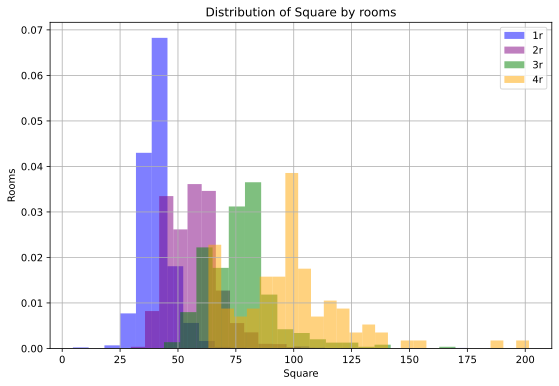

(44.0, 64.0, 83.0, 106.0)

In [35]:
rooms = df_train['Rooms']
plt.figure(figsize = (9, 6))

df_train.loc[rooms == 1, 'Square'].hist(bins=25, density=True, color ='b', alpha=0.5, label ='1r')
df_train.loc[rooms == 2, 'Square'].hist(bins=25, density=True, color ='Purple', alpha=0.5, label ='2r')
df_train.loc[rooms == 3, 'Square'].hist(bins=25, density=True, color ='g', alpha=0.5, label ='3r')
df_train.loc[rooms == 4, 'Square'].hist(bins=25, density=True, color ='Orange', alpha=0.5, label ='4r')
plt.xlabel('Square')
plt.ylabel('Rooms')
plt.title('Distribution of Square by rooms')
plt.legend()
plt.show()

quantile1 = np.around(df_train.loc[rooms == 1, 'Square'].quantile(.75))
quantile2 = np.around(df_train.loc[rooms == 2, 'Square'].quantile(.75))
quantile3 = np.around(df_train.loc[rooms == 3, 'Square'].quantile(.75))
quantile4 = np.around(df_train.loc[rooms == 4, 'Square'].quantile(.75))

quantile1, quantile2, quantile3, quantile4

Заменим количество комнат в выбросах на количество комнат, характерное для данной площади:

In [36]:
outrooms_train = df_train.loc[df_train['Rooms'].between(5, 19) | (df_train['Rooms'] == 0)]

for i in outrooms_train.index:
    if (outrooms_train.loc[(i),'Square']) < quantile1:
        (outrooms_train.loc[(i),'Rooms']) = 1
    elif (outrooms_train.loc[(i),'Square']) < quantile2:
        (outrooms_train.loc[(i),'Rooms']) = 2
    elif (outrooms_train.loc[(i),'Square']) < quantile3:
        (outrooms_train.loc[(i),'Rooms']) = 3
    elif (outrooms_train.loc[(i),'Square']) > quantile3:
        (outrooms_train.loc[(i),'Rooms']) = 4
df_train.loc[(df_train['Rooms'] == 0) | (df_train['Rooms'] > 4), 'Rooms'] = outrooms_train['Rooms']

df_train.loc[(df_train['Rooms'] == 0) | (df_train['Rooms'] > 4)]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,OutliersSquare,OutliersLifeSquare,MismatchedSquares,OutliersKitchen,OutliersRooms


Также заменим в test и valid

In [37]:
outrooms_valid = df_valid.loc[df_valid['Rooms'].between(5, 19) | (df_valid['Rooms'] == 0)]

for i in outrooms_valid.index:
    if (outrooms_valid.loc[(i),'Square']) < quantile1:
        (outrooms_valid.loc[(i),'Rooms']) = 1
    elif (outrooms_valid.loc[(i),'Square']) < quantile2:
        (outrooms_valid.loc[(i),'Rooms']) = 2
    elif (outrooms_valid.loc[(i),'Square']) < quantile3:
        (outrooms_valid.loc[(i),'Rooms']) = 3
    elif (outrooms_valid.loc[(i),'Square']) > quantile3:
        (outrooms_valid.loc[(i),'Rooms']) = 4
df_valid.loc[(df_valid['Rooms'] == 0) | (df_valid['Rooms'] > 4), 'Rooms'] = outrooms_valid['Rooms']

df_valid.loc[(df_valid['Rooms'] == 0) | (df_valid['Rooms'] > 4)]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,OutliersSquare,OutliersLifeSquare,MismatchedSquares,OutliersKitchen,OutliersRooms


In [38]:
outrooms_test = df_test.loc[df_test['Rooms'].between(5, 19) | (df_test['Rooms'] == 0)]

for i in outrooms_test.index:
    if (outrooms_test.loc[(i),'Square']) < quantile1:
        (outrooms_test.loc[(i),'Rooms']) = 1
    elif (outrooms_test.loc[(i),'Square']) < quantile2:
        (outrooms_test.loc[(i),'Rooms']) = 2
    elif (outrooms_test.loc[(i),'Square']) < quantile3:
        (outrooms_test.loc[(i),'Rooms']) = 3
    elif (outrooms_test.loc[(i),'Square']) > quantile3:
        (outrooms_test.loc[(i),'Rooms']) = 4
df_test.loc[(df_test['Rooms'] == 0) | (df_test['Rooms'] > 4), 'Rooms'] = outrooms_test['Rooms']

df_test.loc[(df_test['Rooms'] == 0) | (df_test['Rooms'] > 4)]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,OutliersSquare,OutliersLifeSquare,MismatchedSquares,OutliersKitchen,OutliersRooms


* `LifeSquare`

В колонке жилой площади у нас есть очень много пропусков. Построим алгоритм, который предскажет нам эти значения, затем заполним ими пропуски. Предварительно добавим флаги о пустых значениях. Для обучения алгоритма заполнения пропусков будем использовать только train данные

In [39]:
df_train['NanLifeSquare'] = 0
df_train['NanLifeSquare'].loc[df_train['LifeSquare'].isnull()] = 1

df_valid['NanLifeSquare'] = 0
df_valid['NanLifeSquare'].loc[df_valid['LifeSquare'].isnull()] = 1

df_test['NanLifeSquare'] = 0
df_test['NanLifeSquare'].loc[df_test['LifeSquare'].isnull()] = 1

In [40]:
print("train: ", df_train['NanLifeSquare'].value_counts(),
      "\nvalid: ", df_valid['NanLifeSquare'].value_counts(),
      "\ntest: ", df_test['NanLifeSquare'].value_counts(), sep='\n')

train: 
0    5513
1    1485
Name: NanLifeSquare, dtype: int64

valid: 
0    2373
1     627
Name: NanLifeSquare, dtype: int64

test: 
0    3959
1    1041
Name: NanLifeSquare, dtype: int64


Построим модель после генерации новых признаков

* `HouseFloor` 

Проверим, нет ли у нас выбросов - домов, с нулевым числом этажей

In [41]:
df_train.loc[df_train['HouseFloor'] == 0]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,OutliersSquare,OutliersLifeSquare,MismatchedSquares,OutliersKitchen,OutliersRooms,NanLifeSquare
5753,3766,62,3.0,127.417560,NaN,0.0,9,0.0,1977,0.072158,B,B,2,629,1,NaN,0,0,A,282877.332154,0,0,0,0,0,1
8353,13552,62,2.0,71.567578,NaN,0.0,7,0.0,1977,0.072158,B,B,2,629,1,NaN,0,0,A,159659.160189,0,0,0,0,0,1
2569,6837,165,1.0,40.781752,19.251596,0.0,9,0.0,1977,0.020741,B,B,24,5613,5,1340.0,2,5,B,131026.307065,0,0,0,0,0,0
9573,805,27,3.0,80.701454,NaN,0.0,12,0.0,1977,0.211401,B,B,9,1892,0,NaN,0,1,B,174758.681454,0,0,0,0,0,1
9534,15563,27,2.0,78.553375,NaN,0.0,7,0.0,1977,0.072158,B,B,2,629,1,NaN,0,0,A,181955.274013,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1484,8608,27,2.0,62.576404,NaN,0.0,2,0.0,1977,0.011654,B,B,4,915,0,NaN,0,0,B,188644.907765,0,0,0,0,0,1
8996,15661,45,3.0,81.094922,NaN,0.0,15,0.0,1977,0.195781,B,B,23,5212,6,NaN,3,2,B,442472.456032,0,0,0,0,0,1
9268,13665,62,2.0,57.717659,NaN,0.0,10,0.0,1977,0.072158,B,B,2,629,1,NaN,0,0,A,176072.619971,0,0,0,0,0,1
5675,2124,62,1.0,45.592499,NaN,0.0,12,0.0,1977,0.072158,B,B,2,629,1,NaN,0,0,A,123553.869052,0,0,0,0,0,1


заполним нули так, чтобы считалось самое часто встречающееся значение высоты домов больших, чем этаж квартиры

In [42]:
def fill_nan_housefloor(df):
    floor = df['Floor'].loc[df['HouseFloor'] == 0]
    house_floor = df['HouseFloor'].loc[df['HouseFloor'] == 0]

    mode1=[]
    for e in floor.values:
        a = df_train['HouseFloor'].loc[df_train['HouseFloor'].values >= e].mode()[0]
        mode1.append(a)
    for i in range(0, len(mode1)):
        house_floor.values[i] = mode1[i]
    df['HouseFloor'].loc[df['HouseFloor'] == 0] = house_floor

In [43]:
fill_nan_housefloor(df_train)
fill_nan_housefloor(df_valid)
fill_nan_housefloor(df_test)

df_train.loc[df_train['HouseFloor'] == 0, 'HouseFloor'].count(), \
df_valid.loc[df_valid['HouseFloor'] == 0, 'HouseFloor'].count(), \
df_test.loc[df_test['HouseFloor'] == 0, 'HouseFloor'].count()

(0, 0, 0)

* `Floor`  

Проверим, нет ли ситуации, когда этаж квартиры выше высоты дома

In [44]:
df_train.loc[df_train['Floor'] > df_train['HouseFloor']]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,OutliersSquare,OutliersLifeSquare,MismatchedSquares,OutliersKitchen,OutliersRooms,NanLifeSquare
2603,5621,23,3.0,163.495333,161.504222,12.0,5,3.0,1977,0.014073,B,B,2,475,0,NaN,0,0,B,207007.956663,0,0,0,0,0,0
1579,16258,48,3.0,98.152802,96.056784,1.0,15,1.0,2017,0.041125,B,B,46,9515,5,NaN,1,10,B,524365.550705,0,0,1,0,0,0
3548,11463,129,3.0,72.953912,39.478723,9.0,16,15.0,1991,0.460556,B,B,20,4386,14,NaN,1,5,B,358129.914474,0,0,0,0,0,0
2726,9347,27,1.0,46.513651,21.032802,14.0,7,6.0,1977,0.075424,B,B,11,3097,0,NaN,0,0,B,124345.245905,0,0,0,0,0,0
477,8849,45,1.0,63.419553,2.286357,1.0,3,1.0,1977,0.195781,B,B,23,5212,6,NaN,3,2,B,325600.765809,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
161,4263,27,1.0,54.255191,51.135219,0.0,5,3.0,2017,0.072158,B,B,2,629,1,NaN,0,0,A,147040.226120,0,0,0,0,0,0
5393,1040,27,2.0,65.088892,NaN,1.0,10,1.0,1977,0.072158,B,B,2,629,1,NaN,0,0,A,179525.641685,0,0,0,0,0,1
2047,12545,9,3.0,83.978425,NaN,1.0,10,1.0,1977,0.161532,B,B,25,5648,1,30.0,2,4,B,219577.830422,0,0,0,0,0,1
1685,1454,21,3.0,51.195460,36.951319,5.0,10,9.0,1974,0.194489,B,B,47,8004,3,125.0,3,5,B,213426.111753,0,0,0,0,0,0


Предположим, что значения были перепутаны, поменяем их местами

In [45]:
def change_floor(df):
    floor_err = df['Floor'] > df['HouseFloor']
    df['Floor'].loc[floor_err], df['HouseFloor'].loc[floor_err] = \
    df['HouseFloor'].loc[floor_err], df['Floor'].loc[floor_err]

change_floor(df_train)
change_floor(df_valid)
change_floor(df_test)

In [46]:
# df_train.loc[df_train['Floor'] > df_train['HouseFloor']]
# df_valid.loc[df_valid['Floor'] > df_valid['HouseFloor']]
df_test.loc[df_test['Floor'] > df_test['HouseFloor']]

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,OutliersSquare,OutliersLifeSquare,MismatchedSquares,OutliersKitchen,OutliersRooms,NanLifeSquare


* `HouseYear`

Видно, что есть ошибки в двух наблюдениях 
Заменим оба года

In [47]:
df_train.loc[(df_train['HouseYear'] > 2020) | (df_train['HouseYear'] < 1900)] 
# df_valid.loc[(df_valid['HouseYear'] > 2020) | (df_valid['HouseYear'] < 1900)]
# df_test.loc[(df_test['HouseYear'] > 2020) | (df_test['HouseYear'] < 1900)] 

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,OutliersSquare,OutliersLifeSquare,MismatchedSquares,OutliersKitchen,OutliersRooms,NanLifeSquare
4189,11607,147,2.0,44.791836,28.360393,5.0,4.0,9.0,4968,0.319809,B,B,25,4756,16,2857.0,5,8,B,243028.603096,0,0,0,0,0,0
1497,10814,109,1.0,37.265070,20.239714,9.0,9.0,12.0,20052011,0.136330,B,B,30,6141,10,262.0,3,6,B,254084.534396,0,0,0,0,0,0


In [48]:
df_train['HouseYear'][df_train['HouseYear'] == 4968] = 1968
df_train['HouseYear'][df_train['HouseYear'] == 20052011] = 2011
df_train.loc[df_train['HouseYear'] > 2020, 'HouseYear'] = df_train['HouseYear'].median
df_valid.loc[df_valid['HouseYear'] > 2020, 'HouseYear'] = df_train['HouseYear'].median
df_test.loc[df_test['HouseYear'] > 2020, 'HouseYear'] = df_train['HouseYear'].median

* `Healthcare_1` - заменим пустоты на медиану, добавим признак пустот

In [49]:
df_train['NanHealthcare'] = 0
df_train['NanHealthcare'].loc[df_train['Healthcare_1'].isnull()] = 1

df_valid['NanHealthcare'] = 0
df_valid['NanHealthcare'].loc[df_valid['Healthcare_1'].isnull()] = 1

df_test['NanHealthcare'] = 0
df_test['NanHealthcare'].loc[df_test['Healthcare_1'].isnull()] = 1

In [50]:
median_health = df_train['Healthcare_1'].median()

In [51]:
# group_h = df_train.groupby(['DistrictId'])['Healthcare_1'].agg('mean').to_dict()

# df_train.loc[df_train['Healthcare_1'].isna(), 'Healthcare_1'] = df_train['DistrictId'].map(group_h)
# df_valid.loc[df_valid['Healthcare_1'].isna(), 'Healthcare_1'] = df_valid['DistrictId'].map(group_h)
# df_test.loc[df_test['Healthcare_1'].isna(), 'Healthcare_1'] = df_test['DistrictId'].map(group_h)

In [52]:
# df_train['Healthcare_1'].fillna(median_health, inplace=True)
# df_valid['Healthcare_1'].fillna(median_health, inplace=True)
# df_test['Healthcare_1'].fillna(median_health, inplace=True)

* `Floor` - заменим слишком высокие этажи на одно значение (> 18 на 18)

In [53]:
df_train.Floor.value_counts()

5.0     728
4.0     635
3.0     601
9.0     534
1.0     506
7.0     457
6.0     456
8.0     447
2.0     400
12.0    341
10.0    277
11.0    254
14.0    248
17.0    242
13.0    202
16.0    197
15.0    179
18.0     54
19.0     46
20.0     40
22.0     36
21.0     33
24.0     30
25.0     26
23.0     20
28.0      2
32.0      2
26.0      2
33.0      1
31.0      1
42.0      1
Name: Floor, dtype: int64

In [54]:
# df_train.loc[df_train['Floor'] > 25, 'Floor'] = 26
# df_test.loc[df_test['Floor'] > 25, 'Floor'] = 26
# df_valid.loc[df_valid['Floor'] > 25, 'Floor'] = 26
# df_valid.Floor.value_counts()

In [55]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6998 entries, 9069 to 7270
Data columns (total 27 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Id                  6998 non-null   object 
 1   DistrictId          6998 non-null   int64  
 2   Rooms               6998 non-null   float64
 3   Square              6998 non-null   float64
 4   LifeSquare          5513 non-null   float64
 5   KitchenSquare       6998 non-null   float64
 6   Floor               6998 non-null   float64
 7   HouseFloor          6998 non-null   float64
 8   HouseYear           6998 non-null   object 
 9   Ecology_1           6998 non-null   float64
 10  Ecology_2           6998 non-null   object 
 11  Ecology_3           6998 non-null   object 
 12  Social_1            6998 non-null   int64  
 13  Social_2            6998 non-null   int64  
 14  Social_3            6998 non-null   int64  
 15  Healthcare_1        3640 non-null   float64
 16  Hel

In [56]:
list(df_train.columns.values) 

['Id',
 'DistrictId',
 'Rooms',
 'Square',
 'LifeSquare',
 'KitchenSquare',
 'Floor',
 'HouseFloor',
 'HouseYear',
 'Ecology_1',
 'Ecology_2',
 'Ecology_3',
 'Social_1',
 'Social_2',
 'Social_3',
 'Healthcare_1',
 'Helthcare_2',
 'Shops_1',
 'Shops_2',
 'Price',
 'OutliersSquare',
 'OutliersLifeSquare',
 'MismatchedSquares',
 'OutliersKitchen',
 'OutliersRooms',
 'NanLifeSquare',
 'NanHealthcare']

Построим матрицу кореляций, чтобы предварительно оценить возможность создания новых признаков 

In [57]:
features = ['Rooms', 'Square', 'LifeSquare', 'KitchenSquare', 'Floor', 'HouseFloor',
            'HouseYear', 'Ecology_1', 'Ecology_2', 'Ecology_3', 'Social_1', 'Social_2', 
            'Social_3', 'Healthcare_1', 'Helthcare_2', 'Shops_1', 'Shops_2', 'Price', 'OutliersSquare',
            'OutliersLifeSquare', 
            'MismatchedSquares', 'OutliersKitchen', 'OutliersRooms',
            'NanLifeSquare']

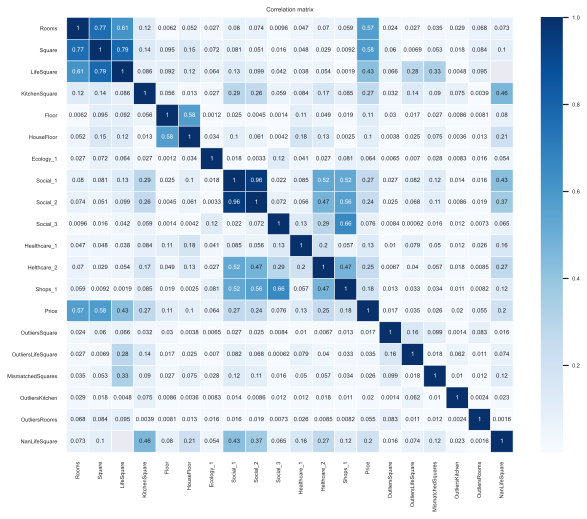

In [58]:
df_train[features].corr()
plt.figure(figsize=(10,8))

sns.set(font_scale=0.5)
sns.heatmap(df_train[features].corr().abs(), annot=True, linewidth=.5, cmap='Blues')
plt.title('Correlation matrix')
plt.show()

* Жилая и общая площади напрямую связаны с ценой
* Количество комнат также связаны с ценой, и зависит от площади
* Год постройки связан с этажностью дома и площадью (Возможно, чем старше, чем выше и больше площадь)
* Healthcare_2 сязан с Social_1 и Social_2, и все эти показатели связаны с Shops_1 - скорее всего, это спальные районы, в которых есть поликлиники и магазины


### Обработка категориальных признаков

* `Ecology_2` 
* `Ecology_3`
* `Shops_2`

In [59]:
cat_colnames = df_train.select_dtypes(include='object').columns.tolist()
cat_colnames

['Id', 'HouseYear', 'Ecology_2', 'Ecology_3', 'Shops_2']

In [60]:
def print_cat_columns(df, name):
    print('=' * 100 + '\n' + name  + '\n\n')
    for cat_colname in cat_colnames[1:]:
        print(str(cat_colname) + '\n\n' + \
              str(df[cat_colname].value_counts()) + \
              '\n' + '-' * 100 + '\n')

In [61]:
print_cat_columns(df_train, 'Train'), \
print_cat_columns(df_valid, 'Valid'), \
print_cat_columns(df_test, 'Test') 

Train


HouseYear

1977    1870
2017     217
2015     208
2016     206
2014     146
        ... 
1947       1
1929       1
1916       1
1914       1
1912       1
Name: HouseYear, Length: 92, dtype: int64
----------------------------------------------------------------------------------------------------

Ecology_2

B    6934
A      64
Name: Ecology_2, dtype: int64
----------------------------------------------------------------------------------------------------

Ecology_3

B    6796
A     202
Name: Ecology_3, dtype: int64
----------------------------------------------------------------------------------------------------

Shops_2

B    6414
A     584
Name: Shops_2, dtype: int64
----------------------------------------------------------------------------------------------------

Valid


HouseYear

1977    781
2016     98
2015     91
2017     91
1974     66
       ... 
1933      1
1929      1
1939      1
1942      1
1910      1
Name: HouseYear, Length: 86, dtype: int64
----------------

(None, None, None)

добавим новый признак, который преобразуем в биннарный (One Hot Encoding)

In [62]:
list_df = [df_train, df_valid, df_test]
for df in list_df:
    df['Ecology_Concat23'] = df['Ecology_2'] + df['Ecology_3']

In [63]:
df_train = pd.concat([df_train, pd.get_dummies(df_train['Ecology_Concat23'])], axis=1)
df_train = df_train.drop('Ecology_Concat23', axis=1)

df_valid = pd.concat([df_valid, pd.get_dummies(df_valid['Ecology_Concat23'])], axis=1)
df_valid = df_valid.drop('Ecology_Concat23', axis=1)

df_test = pd.concat([df_test, pd.get_dummies(df_test['Ecology_Concat23'])], axis=1)
df_test = df_test.drop('Ecology_Concat23', axis=1)

In [64]:
df_valid

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,OutliersSquare,OutliersLifeSquare,MismatchedSquares,OutliersKitchen,OutliersRooms,NanLifeSquare,NanHealthcare,AB,BA,BB
6252,3702,21,2.0,48.812195,34.679779,5.0,5.0,5.0,1963,0.034331,B,B,25,5487,3,NaN,0,4,B,181530.459031,0,0,0,0,0,0,1,0,0,1
4684,12848,61,3.0,81.103039,49.310278,8.0,4.0,4.0,1960,0.298205,B,B,16,4048,3,NaN,1,3,B,260456.004692,0,0,0,0,0,0,1,0,0,1
1731,2239,6,3.0,82.882978,3.977650,1.0,8.0,17.0,1977,0.243205,B,B,5,1564,0,540.0,0,0,B,219945.304640,0,1,0,0,0,0,0,0,0,1
4742,15611,23,1.0,33.863324,29.993297,0.0,4.0,5.0,1977,0.034656,B,B,0,168,0,NaN,0,0,B,66883.280318,0,0,0,0,0,0,1,0,0,1
4521,5634,52,1.0,43.095135,NaN,1.0,10.0,17.0,1977,0.371149,B,B,34,7065,1,750.0,2,5,B,114086.065201,0,0,0,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8014,10092,26,1.0,35.199090,22.014067,5.0,2.0,5.0,1966,0.000000,B,B,36,6714,2,2672.0,0,2,B,139561.798320,0,0,0,0,0,0,0,0,0,1
1074,8776,27,2.0,67.026174,NaN,1.0,2.0,17.0,1977,0.211401,B,B,9,1892,0,NaN,0,1,B,154696.067043,0,0,0,0,0,1,1,0,0,1
3063,13708,24,2.0,51.954623,NaN,0.0,13.0,17.0,1977,0.111627,B,B,50,12238,8,1970.0,2,3,B,296550.564643,0,0,0,0,0,1,0,0,0,1
6487,15863,58,1.0,47.309137,NaN,1.0,1.0,1.0,1977,0.437885,B,B,23,5735,3,1084.0,0,5,B,114949.106711,0,0,0,0,0,1,0,0,0,1


заменим Колонки с A и B на 0 и 1

In [65]:
def change_categories(df, name):  
    print('=' * 100 + '\n' + name  + '\n\n')
    for cat_colname in cat_colnames[1:]:
        df[cat_colname][df[cat_colname].values == 'A'] = 0
        df[cat_colname][df[cat_colname].values == 'B'] = 1
        print(str(cat_colname) + '\n\n' + str(df[cat_colname].value_counts()) + '\n' + '-' * 100 + '\n')

    df['Ecology_2'] = df['Ecology_2'].astype('int64')
    df['Ecology_3'] = df['Ecology_3'].astype('int64')
    df['Shops_2'] = df['Shops_2'].astype('int64')   
    
change_categories(df_train, 'Train')
change_categories(df_valid, 'Valid')
change_categories(df_test, 'Test')

Train


HouseYear

1977    1870
2017     217
2015     208
2016     206
2014     146
        ... 
1947       1
1929       1
1916       1
1914       1
1912       1
Name: HouseYear, Length: 92, dtype: int64
----------------------------------------------------------------------------------------------------

Ecology_2

1    6934
0      64
Name: Ecology_2, dtype: int64
----------------------------------------------------------------------------------------------------

Ecology_3

1    6796
0     202
Name: Ecology_3, dtype: int64
----------------------------------------------------------------------------------------------------

Shops_2

1    6414
0     584
Name: Shops_2, dtype: int64
----------------------------------------------------------------------------------------------------

Valid


HouseYear

1977    781
2016     98
2015     91
2017     91
1974     66
       ... 
1933      1
1929      1
1939      1
1942      1
1910      1
Name: HouseYear, Length: 86, dtype: int64
----------------

In [66]:
df_train.info()
# df_valid.info()
# df_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6998 entries, 9069 to 7270
Data columns (total 30 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Id                  6998 non-null   object 
 1   DistrictId          6998 non-null   int64  
 2   Rooms               6998 non-null   float64
 3   Square              6998 non-null   float64
 4   LifeSquare          5513 non-null   float64
 5   KitchenSquare       6998 non-null   float64
 6   Floor               6998 non-null   float64
 7   HouseFloor          6998 non-null   float64
 8   HouseYear           6998 non-null   object 
 9   Ecology_1           6998 non-null   float64
 10  Ecology_2           6998 non-null   int64  
 11  Ecology_3           6998 non-null   int64  
 12  Social_1            6998 non-null   int64  
 13  Social_2            6998 non-null   int64  
 14  Social_3            6998 non-null   int64  
 15  Healthcare_1        3640 non-null   float64
 16  Hel

### Построение новых признаков

* `MeanSquareByRooms` средняя площадь квартир по комнатам

In [67]:
gp = df_train.groupby(['Rooms'])['Square'].mean()
df_train["MeanSquareByRooms"] = df_train['Rooms'].map(gp.to_dict())
df_valid["MeanSquareByRooms"] = df_valid['Rooms'].map(gp.to_dict())
df_test["MeanSquareByRooms"] = df_test['Rooms'].map(gp.to_dict())
gp

Rooms
1.0     41.321713
2.0     56.668441
3.0     77.251777
4.0    100.606092
Name: Square, dtype: float64

* `DeviaSquareByRooms` отклонение от средней площади

In [68]:
df_train['DeviaSquareByRooms'] = df_train['Square'] - df_train['MeanSquareByRooms']
df_valid['DeviaSquareByRooms'] = df_valid['Square'] - df_valid['MeanSquareByRooms']
df_test['DeviaSquareByRooms'] = df_test['Square'] - df_test['MeanSquareByRooms']

* `RatioSquareToMean` - отношение площади к средней площади по комнатам

In [69]:
df_train['RatioSquareToMean'] = df_train['Square'] / df_train['MeanSquareByRooms'] - 1
df_valid['RatioSquareToMean'] = df_valid['Square'] / df_valid['MeanSquareByRooms'] - 1
df_test['RatioSquareToMean'] = df_test['Square'] / df_test['MeanSquareByRooms'] - 1

* `DistrictSize` - размер района по количеству наблюдений

In [70]:
DistrictSize = df_train['DistrictId'].value_counts().reset_index()\
               .rename(columns={'index':'DistrictId', 'DistrictId':'DistrictSize'})
df_train = df_train.merge(DistrictSize, on='DistrictId', how='left')

df_valid = df_valid.merge(DistrictSize, on='DistrictId', how='left')
df_valid['DistrictSize'].fillna(0, inplace=True)

df_test = df_test.merge(DistrictSize, on='DistrictId', how='left')
df_test['DistrictSize'].fillna(0, inplace=True)

In [71]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6998 entries, 0 to 6997
Data columns (total 34 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Id                  6998 non-null   object 
 1   DistrictId          6998 non-null   int64  
 2   Rooms               6998 non-null   float64
 3   Square              6998 non-null   float64
 4   LifeSquare          5513 non-null   float64
 5   KitchenSquare       6998 non-null   float64
 6   Floor               6998 non-null   float64
 7   HouseFloor          6998 non-null   float64
 8   HouseYear           6998 non-null   object 
 9   Ecology_1           6998 non-null   float64
 10  Ecology_2           6998 non-null   int64  
 11  Ecology_3           6998 non-null   int64  
 12  Social_1            6998 non-null   int64  
 13  Social_2            6998 non-null   int64  
 14  Social_3            6998 non-null   int64  
 15  Healthcare_1        3640 non-null   float64
 16  Helthc

* `MedPriceByDistrict` - средняя цена по району

In [72]:
MedPriceByDistrict = df_train.groupby(['DistrictId', 'Rooms'], as_index=False).agg({'Price':'median'})\
                       .rename(columns={'Price':'MedPriceByDistrict'})
df_train = df_train.merge(MedPriceByDistrict, on=['DistrictId', 'Rooms'], how='left')
median = df_train['MedPriceByDistrict'].median()

df_valid = df_valid.merge(MedPriceByDistrict, on=['DistrictId', 'Rooms'], how='left')
df_valid['MedPriceByDistrict'].fillna(median, inplace=True)

df_test = df_test.merge(MedPriceByDistrict, on=['DistrictId', 'Rooms'], how='left')
df_test['MedPriceByDistrict'].fillna(median, inplace=True)

* `MedPriceByHouseYear` - средняя цена квартиры, в зависимости от года постройки

In [73]:
MedPriceByHouseYear = df_train.groupby(['HouseYear', 'Rooms'], as_index=False).agg({'Price':'median'})\
                       .rename(columns={'Price':'MedPriceByHouseYear'})
df_train = df_train.merge(MedPriceByHouseYear, on=['HouseYear', 'Rooms'], how='left')

median = df_train['MedPriceByHouseYear'].median()

df_valid = df_valid.merge(MedPriceByHouseYear, on=['HouseYear', 'Rooms'], how='left')
df_valid['MedPriceByHouseYear'].fillna(median, inplace=True)

df_test = df_test.merge(MedPriceByHouseYear, on=['HouseYear', 'Rooms'], how='left')
df_test['MedPriceByHouseYear'].fillna(median, inplace=True)

* `MedPricePerM2ByHouseYear` - средняя цена за 1 м2 в зависимости от года постройки

In [74]:
df_train['MedPricePerM2ByHouseYear'] = df_train['MedPriceByHouseYear'] / df_train['Square']
df_valid['MedPricePerM2ByHouseYear'] = df_valid['MedPriceByHouseYear'] / df_valid['Square']
df_test['MedPricePerM2ByHouseYear'] = df_test['MedPriceByHouseYear'] / df_test['Square']

* `MedPricePerM2ByDistrict` - средняя цена за 1 м2 по району

In [75]:
df_train['MedPricePerM2ByDistrict'] = df_train['MedPriceByDistrict'] / df_train['Square']
df_valid['MedPricePerM2ByDistrict'] = df_valid['MedPriceByDistrict'] / df_valid['Square']
df_test['MedPricePerM2ByDistrict'] = df_test['MedPriceByDistrict'] / df_test['Square']

* `MedPriceByRooms` - средняя цена по комнатам (возможно, лучше удалить)

In [76]:
# возможно, лучше удалить
MedPriceByRooms = df_train.groupby(['Rooms'], as_index=False).agg({'Price':'median'})\
                       .rename(columns={'Price':'MedPriceByRooms'})

df_train = df_train.merge(MedPriceByRooms, on=['Rooms'], how='left')
df_valid = df_valid.merge(MedPriceByRooms, on=['Rooms'], how='left')
df_test = df_test.merge(MedPriceByRooms, on=['Rooms'], how='left')

* `MedSquareByRoomsDist` - средняя площадь по комнатам

In [77]:
MedSquareByRoomsDist = df_train.groupby(['DistrictId', 'Rooms'], as_index=False).agg({'Square':'median'})\
                       .rename(columns={'Square':'MedSquareByRoomsDist'})
df_train = df_train.merge(MedSquareByRoomsDist, on=['DistrictId', 'Rooms'], how='left')
median = df_train['MedSquareByRoomsDist'].median()

df_valid = df_valid.merge(MedSquareByRoomsDist, on=['DistrictId', 'Rooms'], how='left')
df_valid['MedSquareByRoomsDist'].fillna(median, inplace=True)

df_test = df_test.merge(MedSquareByRoomsDist, on=['DistrictId', 'Rooms'], how='left')
df_test['MedSquareByRoomsDist'].fillna(median, inplace=True)

* `MedPriceByRoomsDist` - средняя цена по району за квартиру по количеству комнат 

In [78]:
MedPriceByRoomsDist = df_train.groupby(['DistrictId', 'MedSquareByRoomsDist'], as_index=False).agg({'Price':'median'})\
                       .rename(columns={'Price':'MedPriceByRoomsDist'})
df_train = df_train.merge(MedPriceByRoomsDist, on=['DistrictId', 'MedSquareByRoomsDist'], how='left')
median = df_train['MedPriceByRoomsDist'].median()

df_valid = df_valid.merge(MedPriceByRoomsDist, on=['DistrictId', 'MedSquareByRoomsDist'], how='left')
df_valid['MedPriceByRoomsDist'].fillna(median, inplace=True)

df_test = df_test.merge(MedPriceByRoomsDist, on=['DistrictId', 'MedSquareByRoomsDist'], how='left')
df_test['MedPriceByRoomsDist'].fillna(median, inplace=True)

* `IsDistrictLarge` размер района

In [79]:
df_train['IsDistrictLarge'] = (df_train['DistrictSize'] > 100).astype(int)
df_valid['IsDistrictLarge'] = (df_valid['DistrictSize'] > 100).astype(int)
df_test['IsDistrictLarge'] = (df_test['DistrictSize'] > 100).astype(int)

In [80]:
df_valid.IsDistrictLarge.value_counts()

0    1797
1    1203
Name: IsDistrictLarge, dtype: int64

* `DistrictId` - id района - без него метрика хуже

In [81]:
small_dist = df_train['DistrictId'].value_counts().loc[df_train['DistrictId'].value_counts() < 60].index.to_list()

In [82]:
for id in small_dist:
    df_train['DistrictId'].loc[df_train['DistrictId'] == id] = 9999
    df_valid['DistrictId'].loc[df_valid['DistrictId'] == id] = 9999
    df_test['DistrictId'].loc[df_test['DistrictId'] == id] = 9999
    
df_train['DistrictId'].value_counts()

9999    3008
27       574
1        466
23       394
6        355
9        221
62       175
30       160
53       133
58       118
21       107
8        101
52        96
11        91
61        85
46        84
45        81
74        77
57        74
34        73
99        73
44        69
47        66
101       66
7         64
13        64
48        62
41        61
Name: DistrictId, dtype: int64

In [83]:
# df_train['DistrictId'] = df_train['DistrictId'].astype(str)
# df_test['DistrictId'] = df_test['DistrictId'].astype(str)

* `TotalAppartsByYear` - суммарное количество квартир по году постройки дома

In [84]:
TotalAppartsByYear = df_train['HouseYear'].value_counts().reset_index()\
                    .rename(columns={'index':'HouseYear', 'HouseYear':'TotalAppartsByYear'})
df_train = df_train.merge(TotalAppartsByYear, on='HouseYear', how='left')

df_valid = df_valid.merge(TotalAppartsByYear, on='HouseYear', how='left')
df_valid['TotalAppartsByYear'].fillna(0, inplace=True)

df_test = df_test.merge(TotalAppartsByYear, on='HouseYear', how='left')
df_test['TotalAppartsByYear'].fillna(0, inplace=True)

* `IsHouseOld` - категодия дома в зависимости от его возраста (1 - старый дом, 0 - современный)

In [85]:
df_train['IsHouseOld'] = (df_train['HouseYear'] < 1970).astype(int)
df_valid['IsHouseOld'] = (df_valid['HouseYear'] < 1970).astype(int)
df_test['IsHouseOld'] = (df_test['HouseYear'] < 1970).astype(int)

* `IsHouseYearPopular` - популярен ли год постройки

In [86]:
df_train['IsHouseYearPopular'] = (df_train['TotalAppartsByYear'] > 100).astype(int)
df_valid['IsHouseYearPopular'] = (df_valid['TotalAppartsByYear'] > 100).astype(int)
df_test['IsHouseYearPopular'] = (df_test['TotalAppartsByYear'] > 100).astype(int)

* `FloorLabel` - категория этажа

In [87]:
def floor_label(df):
    df['FloorLabel'] = 0
    df.loc[df['Floor'].between(2, 5), 'FloorLabel'] = 1
    df.loc[df['Floor'].between(5, 10), 'FloorLabel'] = 2
    df.loc[df['Floor'].between(10, 17), 'FloorLabel'] = 3
    df.loc[df['Floor'].between(17, 25), 'FloorLabel'] = 4
    df.loc[df['Floor'] > 25, 'FloorLabel'] = 5
    
floor_label(df_train)
floor_label(df_valid)
floor_label(df_test)

* `MedPriceByFloorRooms` - средняя цена в зависимости от этажа и кол-ва комнат

In [88]:
MedPriceByFloor = df_train.groupby(['FloorLabel', 'Rooms'], as_index=False).agg({'Price':'median'})\
                       .rename(columns={'Price':'MedPriceByFloorRooms'})

df_train = df_train.merge(MedPriceByFloor, on=['FloorLabel', 'Rooms'], how='left')
df_valid = df_valid.merge(MedPriceByFloor, on=['FloorLabel', 'Rooms'], how='left')
df_test = df_test.merge(MedPriceByFloor, on=['FloorLabel', 'Rooms'], how='left')

In [89]:
median_3 = df_train.loc[(df_train['Rooms'] == 3) & (df_train['Floor'] > 20), 'Price'].median()
median_4 = df_train.loc[(df_train['Rooms'] == 4) & (df_train['Floor'] > 20), 'Price'].median()

df_valid['MedPriceByFloorRooms'].loc[df_valid['MedPriceByFloorRooms'].isnull() & (df_valid['Rooms'] == 3)] = median_3
df_valid['MedPriceByFloorRooms'].loc[df_valid['MedPriceByFloorRooms'].isnull() & (df_valid['Rooms'] == 4)] = median_4

df_test['MedPriceByFloorRooms'].loc[df_test['MedPriceByFloorRooms'].isnull() & (df_test['Rooms'] == 3)] = median_3
df_test['MedPriceByFloorRooms'].loc[df_test['MedPriceByFloorRooms'].isnull() & (df_test['Rooms'] == 4)] = median_4

In [90]:
df_test['MedPriceByFloorRooms'].loc[df_test['MedPriceByFloorRooms'].isnull() & (df_test['Rooms'] == 4)]

Series([], Name: MedPriceByFloorRooms, dtype: float64)

### Заполним нули Healthcare_1 моделью 

In [91]:
features_HC = ['Rooms',
         'Square',
         'KitchenSquare',
         'Floor',
         'HouseFloor',
         'HouseYear',
         'Ecology_1',
         'Ecology_2',
         'Ecology_3',
         'Social_1',
         'Social_2',
         'Social_3',
         'Helthcare_2',
         'Shops_1',
         'Shops_2']

target_HC = 'Healthcare_1'

X_train_HC = df_train[features_HC].loc[df_train[target_HC].notnull()]
Y_train_HC = df_train[target_HC].loc[df_train[target_HC].notnull()]

X_test_HC = df_train[features_HC].loc[df_train[target_HC].isnull()]
X_test_HC2 = df_valid[features_HC].loc[df_valid[target_HC].isnull()]
X_test_HC3 = df_test[features_HC].loc[df_test[target_HC].isnull()]

# X_train, X_test, y_train, y_test = train_test_split(X_train_HC, Y_train_HC, shuffle=True, test_size=0.3, random_state=21)

In [92]:
rf_for_HC = RandomForestRegressor(max_depth=7, max_features=11, n_estimators=300, random_state=42)
# - R2 - test 0.953, train - 0.964 

# rf_for_HC.fit(X_train, y_train)

rf_for_HC.fit(X_train_HC, Y_train_HC)


# Y_train_preds = rf_for_HC.predict(X_train)
# Y_test_preds = rf_for_HC.predict(X_test)

# evaluate_preds(y_train, Y_train_preds, y_test, Y_test_preds)

RandomForestRegressor(max_depth=7, max_features=11, n_estimators=300,
                      random_state=42)

In [93]:
df_train.loc[df_train['Healthcare_1'].isnull(), 'Healthcare_1'] = rf_for_HC.predict(X_test_HC)
df_valid.loc[df_valid['Healthcare_1'].isnull(), 'Healthcare_1'] = rf_for_HC.predict(X_test_HC2) 
df_test.loc[df_test['Healthcare_1'].isnull(), 'Healthcare_1'] = rf_for_HC.predict(X_test_HC3) 

### Заполним нули LifeSquare моделью

In [94]:
columns = df_train.columns.to_list()[2:]
columns.remove('LifeSquare')
columns.remove('Price')
columns

['Rooms',
 'Square',
 'KitchenSquare',
 'Floor',
 'HouseFloor',
 'HouseYear',
 'Ecology_1',
 'Ecology_2',
 'Ecology_3',
 'Social_1',
 'Social_2',
 'Social_3',
 'Healthcare_1',
 'Helthcare_2',
 'Shops_1',
 'Shops_2',
 'OutliersSquare',
 'OutliersLifeSquare',
 'MismatchedSquares',
 'OutliersKitchen',
 'OutliersRooms',
 'NanLifeSquare',
 'NanHealthcare',
 'AB',
 'BA',
 'BB',
 'MeanSquareByRooms',
 'DeviaSquareByRooms',
 'RatioSquareToMean',
 'DistrictSize',
 'MedPriceByDistrict',
 'MedPriceByHouseYear',
 'MedPricePerM2ByHouseYear',
 'MedPricePerM2ByDistrict',
 'MedPriceByRooms',
 'MedSquareByRoomsDist',
 'MedPriceByRoomsDist',
 'IsDistrictLarge',
 'TotalAppartsByYear',
 'IsHouseOld',
 'IsHouseYearPopular',
 'FloorLabel',
 'MedPriceByFloorRooms']

In [95]:
features_LS = ['Rooms',
               'Square',
               'KitchenSquare',
               'HouseFloor',
               'HouseYear',
               'Social_1',
               'Healthcare_1',
               'Shops_1',
               'OutliersSquare',
               'OutliersLifeSquare',
               'MismatchedSquares',
               'OutliersKitchen',
               'OutliersRooms',
               'AB', 'BA', 'BB',
               'MeanSquareByRooms',
               'DeviaSquareByRooms',
               'RatioSquareToMean'
              ]

target_LS = 'LifeSquare'

X_train_LS = df_train[features_LS].loc[df_train[target_LS].notnull()]
Y_train_LS = df_train[target_LS].loc[df_train[target_LS].notnull()]

X_test_LS = df_train[features_LS].loc[df_train[target_LS].isnull()]
X_test_LS2 = df_valid[features_LS].loc[df_valid[target_LS].isnull()]
X_test_LS3 = df_test[features_LS].loc[df_test[target_LS].isnull()]

# X_train, X_test, y_train, y_test = train_test_split(X_train_LS, Y_train_LS, shuffle=True, test_size=0.3, random_state=21)

In [96]:
rf_for_LS = RandomForestRegressor(max_depth=7, max_features=11, n_estimators=300, random_state=42)
# rf_for_LS.fit(X_train, y_train)

rf_for_LS.fit(X_train_LS, Y_train_LS)


# Y_train_preds = rf_for_LS.predict(X_train)
# Y_test_preds = rf_for_LS.predict(X_test)

# evaluate_preds(y_train, Y_train_preds, y_test, Y_test_preds)

RandomForestRegressor(max_depth=7, max_features=11, n_estimators=300,
                      random_state=42)

In [97]:
df_train.loc[df_train['LifeSquare'].isnull(), 'LifeSquare'] = rf_for_LS.predict(X_test_LS)
df_valid.loc[df_valid['LifeSquare'].isnull(), 'LifeSquare'] = rf_for_LS.predict(X_test_LS2) 
df_test.loc[df_test['LifeSquare'].isnull(), 'LifeSquare'] = rf_for_LS.predict(X_test_LS3) 

In [98]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5000 entries, 0 to 4999
Data columns (total 46 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Id                        5000 non-null   object 
 1   DistrictId                5000 non-null   int64  
 2   Rooms                     5000 non-null   float64
 3   Square                    5000 non-null   float64
 4   LifeSquare                5000 non-null   float64
 5   KitchenSquare             5000 non-null   float64
 6   Floor                     5000 non-null   float64
 7   HouseFloor                5000 non-null   float64
 8   HouseYear                 5000 non-null   object 
 9   Ecology_1                 5000 non-null   float64
 10  Ecology_2                 5000 non-null   int64  
 11  Ecology_3                 5000 non-null   int64  
 12  Social_1                  5000 non-null   int64  
 13  Social_2                  5000 non-null   int64  
 14  Social_3

* `RatioLifeSquareToSquare` - доля жилой площади к общей

In [99]:
df_train['RatioLifeSquareToSquare'] = df_train['LifeSquare'] / df_train['Square']
df_valid['RatioLifeSquareToSquare'] = df_valid['LifeSquare'] / df_valid['Square']
df_test['RatioLifeSquareToSquare'] = df_test['LifeSquare'] / df_test['Square']

* `MeanLifeSquareByRooms` - доля жилой площади к общей

In [100]:
df_train

,Id,DistrictId,Rooms,Square,LifeSquare,KitchenSquare,Floor,HouseFloor,HouseYear,Ecology_1,Ecology_2,Ecology_3,Social_1,Social_2,Social_3,Healthcare_1,Helthcare_2,Shops_1,Shops_2,Price,OutliersSquare,OutliersLifeSquare,MismatchedSquares,OutliersKitchen,OutliersRooms,NanLifeSquare,NanHealthcare,AB,BA,BB,MeanSquareByRooms,DeviaSquareByRooms,RatioSquareToMean,DistrictSize,MedPriceByDistrict,MedPriceByHouseYear,MedPricePerM2ByHouseYear,MedPricePerM2ByDistrict,MedPriceByRooms,MedSquareByRoomsDist,MedPriceByRoomsDist,IsDistrictLarge,TotalAppartsByYear,IsHouseOld,IsHouseYearPopular,FloorLabel,MedPriceByFloorRooms,RatioLifeSquareToSquare
0,14604,23,1.0,41.681380,22.796166,8.0,14.0,17.0,2015,0.075779,1,1,6,1437,3,1347.817610,0,2,1,88504.384965,0,0,0,0,0,0,1,0,0,1,41.321713,0.359667,0.008704,394,105350.440609,137418.430475,3296.878132,2527.518053,155428.034283,41.628147,105350.440609,1,208,0,1,3,158501.761327,0.546915
1,5621,23,3.0,163.495333,161.504222,12.0,3.0,5.0,1977,0.014073,1,1,2,475,0,633.553730,0,0,1,207007.956663,0,0,0,0,0,0,1,0,0,1,77.251777,86.243556,1.116396,394,157606.065847,223648.280461,1367.918434,963.978987,269029.391523,78.748847,157606.065847,1,1870,0,1,1,249114.537525,0.987822
2,235,9999,1.0,39.710131,19.538663,8.0,4.0,17.0,1986,0.100456,1,1,43,7227,0,464.667886,1,6,0,182126.280899,0,0,0,0,0,0,1,0,0,1,41.321713,-1.611582,-0.039001,21,178279.774392,184074.031377,4635.442573,4489.528751,155428.034283,37.957735,178279.774392,0,48,0,0,1,153831.045013,0.492032
3,16258,48,3.0,98.152802,96.056784,1.0,1.0,15.0,2017,0.041125,1,1,46,9515,5,1321.231298,1,10,1,524365.550705,0,0,1,0,0,0,1,0,0,1,77.251777,20.901025,0.270557,62,397380.028528,309688.592681,3155.168124,4048.585672,269029.391523,82.793962,397380.028528,0,217,0,1,0,230104.568380,0.978645
4,10773,9999,3.0,79.195825,44.421062,10.0,16.0,17.0,1984,0.298205,1,1,16,4048,3,952.014239,1,3,1,322048.433990,0,0,0,0,0,0,1,0,0,1,77.251777,1.944048,0.025165,28,252818.703924,344923.297321,4355.321723,3192.323632,269029.391523,65.460973,252818.703924,0,61,0,0,3,299563.857157,0.560902
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6993,10013,30,2.0,62.405338,62.219340,1.0,2.0,4.0,2015,0.000078,1,1,22,6398,141,1046.000000,3,23,1,150136.610509,0,0,1,0,0,0,0,0,0,1,56.668441,5.736897,0.101236,160,182085.197273,182763.304970,2928.648573,2917.782392,200759.155030,64.075981,182085.197273,1,208,0,1,1,193036.568150,0.997020
6994,6431,9999,3.0,85.790813,74.617536,1.0,9.0,25.0,2018,0.069753,1,1,53,13670,4,1247.370214,1,11,1,328680.869407,0,0,0,0,0,1,1,0,0,1,77.251777,8.539036,0.110535,57,317960.344550,220030.685030,2564.734801,3706.228343,269029.391523,82.370962,317960.344550,0,120,0,1,2,268297.171376,0.869761
6995,14239,1,3.0,83.225854,74.646087,1.0,13.0,17.0,1977,0.007122,1,1,1,264,0,565.271793,0,1,1,255102.406709,0,0,0,0,0,1,1,0,0,1,77.251777,5.974077,0.077333,466,242718.155798,223648.280461,2687.245258,2916.379289,269029.391523,81.671489,242718.155798,1,1870,0,1,3,299563.857157,0.896910
6996,5487,9999,3.0,51.354934,36.538453,5.0,1.0,9.0,1973,0.127376,1,1,43,8429,3,680.822920,3,9,1,182236.048759,0,0,0,0,0,0,1,0,0,1,77.251777,-25.896843,-0.335226,55,235874.713597,236867.916388,4612.369184,4593.029215,269029.391523,61.482571,235874.713597,0,108,0,1,0,230104.568380,0.711489


In [101]:
MeanLifeSquareByRooms = df_train.groupby('Rooms')['LifeSquare'].mean()
df_train["MeanLifeSquareByRooms"] = df_train['Rooms'].map(MeanLifeSquareByRooms.to_dict())
df_valid["MeanLifeSquareByRooms"] = df_valid['Rooms'].map(MeanLifeSquareByRooms.to_dict())
df_test["MeanLifeSquareByRooms"] = df_test['Rooms'].map(MeanLifeSquareByRooms.to_dict())
MeanLifeSquareByRooms

Rooms
1.0    27.809454
2.0    39.839847
3.0    54.665474
4.0    68.639697
Name: LifeSquare, dtype: float64

### Нормализация признаков

In [102]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans, DBSCAN

In [103]:
scaler = MinMaxScaler()
columns_for_scaling = [ 'DistrictId', 'MedPriceByFloorRooms', 'FloorLabel', 'Rooms', 'Square', 'LifeSquare', 'KitchenSquare', 'Floor', 'HouseFloor',
                        'HouseYear', 'Social_1', 'Social_2', 'Social_3', 'Healthcare_1', 'Helthcare_2',
                        'Shops_1', 'MeanSquareByRooms', 'DeviaSquareByRooms', 'RatioSquareToMean',
                        'DistrictSize', 'MedPriceByDistrict', 'MedPriceByHouseYear', 'MedPricePerM2ByHouseYear',
                        'MedPricePerM2ByDistrict', 'MedPriceByRooms', 'MedSquareByRoomsDist', 'MedPriceByRoomsDist',
                        'TotalAppartsByYear',  'RatioLifeSquareToSquare', 'MeanLifeSquareByRooms']

df_train_scaled = df_train.copy()
df_valid_scaled = df_valid.copy()
df_test_scaled = df_test.copy()

df_train_scaled[columns_for_scaling] = scaler.fit_transform(df_train_scaled[columns_for_scaling])
df_valid_scaled[columns_for_scaling] = scaler.transform(df_valid_scaled[columns_for_scaling])
df_test_scaled[columns_for_scaling] = scaler.transform(df_test_scaled[columns_for_scaling])

### Визуализация данных (характеристики района)

Уменьшим размерность данных, чтобы визуализировать из на графике

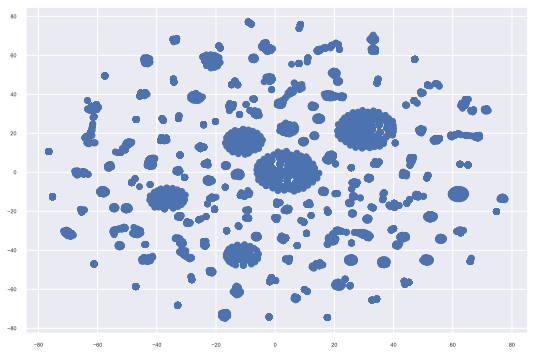

In [104]:
col_for_viz = ['Ecology_1', 'Ecology_2', 'Ecology_3', 'Social_1', 
               'Social_2', 'Social_3', 'Healthcare_1','Helthcare_2', 
               'Shops_1', 'Shops_2', 'AB', 'BA', 'BB']
# , 'DistrictSize', 'DistrictId'
tsne = TSNE(n_components=2, learning_rate=50, random_state=42, perplexity=40)
df_train_tsne = tsne.fit_transform(df_train_scaled[col_for_viz])

get_tsne_plot(df_train_tsne)

### Визуализация данных (все данные)

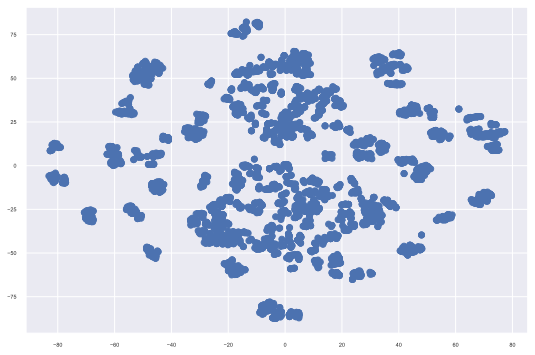

In [105]:
tsne = TSNE(n_components=2, learning_rate=150, random_state=42, perplexity=50)
cols = ['Rooms', 'Square', 'LifeSquare', 'KitchenSquare', 'Floor', 'HouseFloor', 'HouseYear',
        'Ecology_1', 'Ecology_2', 'Ecology_3', 'Social_1', 'Social_2', 'Social_3',
        'Healthcare_1', 'Helthcare_2', 'Shops_1', 'Shops_2', 'OutliersSquare',
        'OutliersLifeSquare', 'MismatchedSquares', 'OutliersKitchen', 'OutliersRooms',
        'NanLifeSquare', 'NanHealthcare', 'AB', 'BA', 'BB', 'DistrictSize', 
        'MedPricePerM2ByHouseYear', 'MedPricePerM2ByDistrict', 'MedSquareByRoomsDist',]

df_train_tsne_all = tsne.fit_transform(df_train_scaled[cols])

get_tsne_plot(df_train_tsne_all)

### Построение модели кластеризации

Text(0.5, 1.0, 'Inertia')

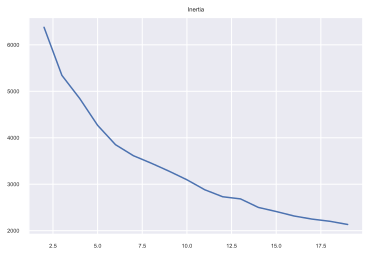

In [106]:
# для всех признаков 
inertia_arr = []
for i in range(2, 20):
    tmp_model = KMeans(n_clusters=i, random_state=42)
    tmp_model.fit(df_train_scaled[cols])
    tmp_inertia = tmp_model.inertia_
    inertia_arr.append(tmp_inertia)
    
plt.plot([i for i in range(2,20)], inertia_arr)
plt.title('Inertia')

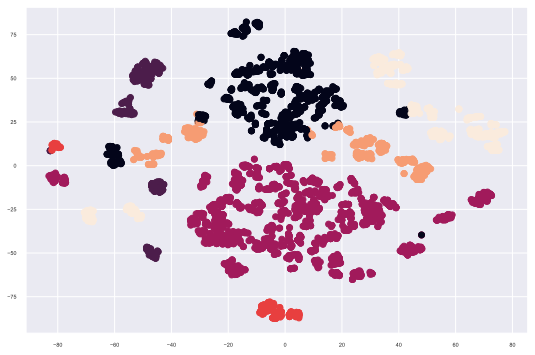

In [107]:
# для всех признаков 
kmeans = KMeans(n_clusters=6, random_state=42)
cluster_labels_train = kmeans.fit_predict(df_train_scaled[cols])
cluster_labels_valid = kmeans.predict(df_valid_scaled[cols])
cluster_labels_test = kmeans.predict(df_test_scaled[cols])
get_tsne_plot(df_train_tsne_all, labels=cluster_labels_train)

Text(0.5, 1.0, 'Inertia')

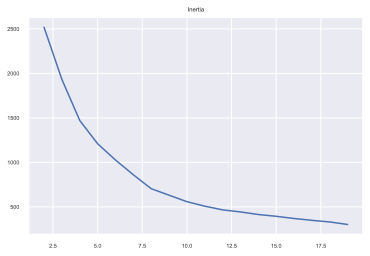

In [108]:
# для признаков по району
inertia_arr = []
for i in range(2, 20):
    tmp_model = KMeans(n_clusters=i, random_state=42)
    tmp_model.fit(df_train_scaled[col_for_viz])
    tmp_inertia = tmp_model.inertia_
    inertia_arr.append(tmp_inertia)
    
plt.plot([i for i in range(2,20)], inertia_arr)
plt.title('Inertia')

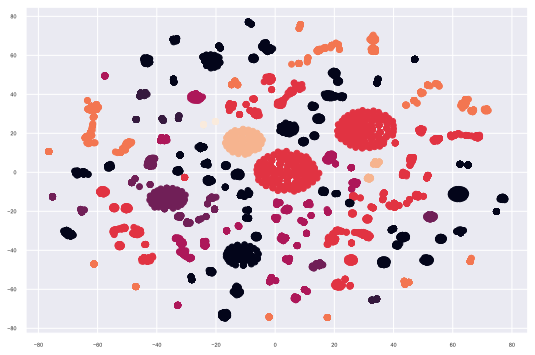

In [109]:
# для признаков по району
kmeans = KMeans(n_clusters=8, random_state=42)
cluster_dist_labels_train = kmeans.fit_predict(df_train_scaled[col_for_viz])
cluster_dist_labels_valid = kmeans.predict(df_valid_scaled[col_for_viz])
cluster_dist_labels_test = kmeans.predict(df_test_scaled[col_for_viz])
get_tsne_plot(df_train_tsne, labels=cluster_dist_labels_train)

In [110]:
# попробовала модель DBSCAN - работает хуже на обоих наборах данных

In [111]:
df_train['GeneralCluster'] = cluster_labels_train
df_valid['GeneralCluster'] = cluster_labels_valid
df_test['GeneralCluster'] = cluster_labels_test

In [112]:
df_train['DistrictCluster'] = cluster_dist_labels_train
df_valid['DistrictCluster'] = cluster_dist_labels_valid
df_test['DistrictCluster'] = cluster_dist_labels_test

Модели с кластеризацией по общим признакам показывают лучший результат, чем без кластеризации.
По районам с кластеризацией модель работает хуже 

### Сохранение данных

In [113]:
df_train.to_csv(PREPARED_TRAIN_DATASET_PATH, index=False, encoding='utf-8')
df_valid.to_csv(PREPARED_VALID_DATASET_PATH, index=False, encoding='utf-8')
df_test.to_csv(PREPARED_TEST_DATASET_PATH, index=False, encoding='utf-8')

### Построение модели для предсказания цены на недвижимость

In [114]:
features = [
            'DistrictId', 
            'Rooms', 
            'Square', 
            'LifeSquare', 
            'KitchenSquare', 
            'Floor', 
            'HouseFloor', 
            'HouseYear', 
            'Ecology_1', 
#             'Ecology_2', 
            'Ecology_3', 
            'Social_1', 
            'Social_2', 
            'Social_3', 
            'Healthcare_1',
            'Helthcare_2', 
            'Shops_1', 
            'Shops_2'
]

new_features = [ 
                'MismatchedSquares', 
                'NanLifeSquare', 
                'NanHealthcare', 
                'FloorLabel',
#                 'MedPriceByFloorRooms',
                'AB', 'BA', 'BB', 
                'DistrictSize', 
#                 'MedPriceByDistrict', 
#                 'MedPriceByHouseYear', 
                'MedPricePerM2ByHouseYear', 
#                 'MedPriceByRooms',
                'MedPricePerM2ByDistrict', 
                'MedSquareByRoomsDist',
#                 'MedPriceByRoomsDist', 
#                 'IsDistrictLarge',
#                 'TotalAppartsByYear', 
#                 'IsHouseOld', 
#                 'IsHouseYearPopular', 
                'GeneralCluster', 
#                 'DistrictCluster',
                'OutliersSquare',
                'OutliersKitchen',
#                 'OutliersRooms',
                'OutliersLifeSquare'
]

target = 'Price'

X_train = df_train[features + new_features]
Y_train = df_train[target]
X_test = df_valid[features + new_features]
Y_test = df_valid[target]

Train R2:	0.863
Test R2:	0.731


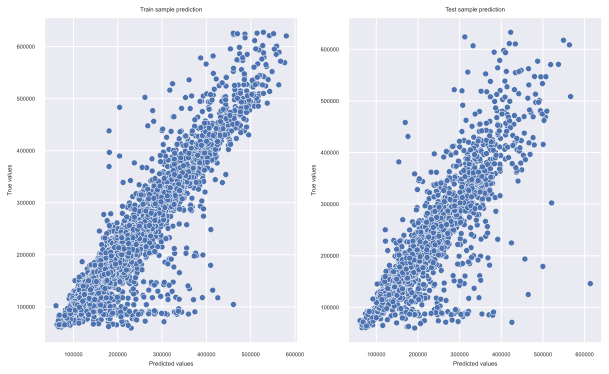

In [115]:
rf_2 = RandomForestRegressor(random_state=21,
                             max_depth=25,
                             max_features=4,
                             n_estimators=1500,
                             min_samples_leaf=25,
                             n_jobs=-1
                             )

gb = GradientBoostingRegressor(random_state=42,
                               max_depth=6,
                               max_features=6,
                               n_estimators=2000,
                               min_samples_split=25,
                               loss='huber',
                               learning_rate=0.02,
                               min_samples_leaf=78)

# bag = BaggingRegressor(base_estimator=gb, n_estimators=15, random_state=42)

# bag = BaggingRegressor(base_estimator=rf_2, n_estimators=15, random_state=42)
# vot = VotingRegressor([('bag', bag), ('rf', rf_2)])
# vot = VotingRegressor([('gb', gb), ('rf', rf_2)])

# estimators = [('bag', bag), ('rf', rf_2), ('vot', vot)]
# reg = StackingRegressor(estimators=estimators, final_estimator=rf_2, n_jobs=-1)


gb.fit(X_train, Y_train)
Y_train_preds = gb.predict(X_train)
Y_test_preds = gb.predict(X_test)

evaluate_preds(Y_train, Y_train_preds, Y_test, Y_test_preds)

In [116]:
cv_score = cross_val_score(
    gb,
    X_train,
    Y_train,
    scoring='r2',
    cv=KFold(n_splits=3, shuffle=True, random_state=42)
)
cv_score

array([0.7795409 , 0.76034731, 0.791509  ])

In [117]:
cv_score.mean()

0.7771324029830242

In [118]:
cv_score.mean() - cv_score.std(), cv_score.mean() + cv_score.std()

(0.7642972055464855, 0.7899676004195629)

In [119]:
feature_importances = pd.DataFrame(zip(X_train.columns, gb.feature_importances_), 
                                   columns=['feature_name', 'importance'])
feature_importances.sort_values(by='importance', ascending=False)

,feature_name,importance
2,Square,0.256915
27,MedSquareByRoomsDist,0.092785
1,Rooms,0.083365
24,DistrictSize,0.081623
26,MedPricePerM2ByDistrict,0.074313
3,LifeSquare,0.065896
10,Social_1,0.051416
11,Social_2,0.046389
0,DistrictId,0.040888
12,Social_3,0.034041


### Сделаем предсказания на test_df

In [120]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5000 entries, 0 to 4999
Data columns (total 50 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Id                        5000 non-null   object 
 1   DistrictId                5000 non-null   int64  
 2   Rooms                     5000 non-null   float64
 3   Square                    5000 non-null   float64
 4   LifeSquare                5000 non-null   float64
 5   KitchenSquare             5000 non-null   float64
 6   Floor                     5000 non-null   float64
 7   HouseFloor                5000 non-null   float64
 8   HouseYear                 5000 non-null   object 
 9   Ecology_1                 5000 non-null   float64
 10  Ecology_2                 5000 non-null   int64  
 11  Ecology_3                 5000 non-null   int64  
 12  Social_1                  5000 non-null   int64  
 13  Social_2                  5000 non-null   int64  
 14  Social_3

In [121]:
X_train_f = df_train[features + new_features]
Y_train_f = df_train['Price']
X_test_f = df_test[features + new_features]

gb = GradientBoostingRegressor(random_state=42,
                               max_depth=6,
                               max_features=6,
                               n_estimators=2000,
                               min_samples_split=25,
                               loss='huber',
                               learning_rate=0.02,
                               min_samples_leaf=78)

gb.fit(X_train_f, Y_train_f)

Y_test_f = gb.predict(X_test_f)
Id = df_test['Id'].values

In [122]:
Y_test = pd.DataFrame({'Id': Id, 'Price':Y_test_f}, columns=['Id','Price'])
Y_test.to_csv('Sokolova_predictions.csv', header=True, index=False, encoding='utf-8')